In [94]:
import numpy as np
import skimage as sk
import skimage.io as skio
import scipy
import matplotlib
from matplotlib import pyplot as plt
from importlib import reload
# local
import utils
reload(utils)
from utils import *

# Part 1: Fun with Filters 
## Part 1.1: Finite Difference Operator

To compute the gradient, we simply use pythagorean theorem (aka L2 norm) - add the square of its components. The components of the gradient are df/dx and dy/dx, which we also calculated. 

In [7]:
D_x = np.array([[1, -1]])
D_y = np.array([[1], [-1]])

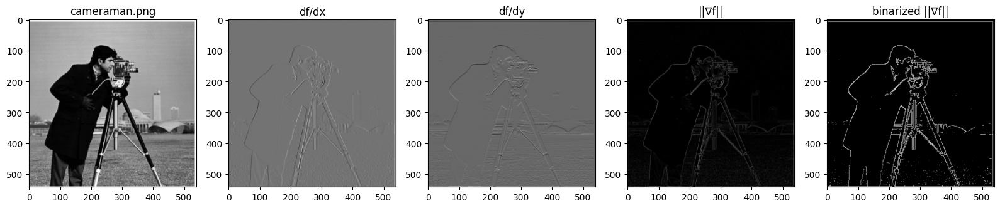

In [12]:
cameraman = skio.imread('data/cameraman.png', as_gray='true')
cameraman = sk.img_as_float(cameraman)

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(16,16))

ax1.imshow(cameraman, cmap='gray')
ax1.set_title('cameraman.png')

cameraman_df_dx = convolve(cameraman, D_x)
ax2.imshow(cameraman_df_dx, cmap='gray')
ax2.set_title("df/dx")

cameraman_df_dy = convolve(cameraman, D_y)
ax3.imshow(cameraman_df_dy, cmap='gray')
ax3.set_title("df/dy")

cameraman_gradient = np.sqrt(cameraman_df_dx ** 2 + cameraman_df_dy ** 2)
ax4.imshow(cameraman_gradient, cmap='gray')
ax4.set_title("||∇f||")

cameraman_binarized = binarize(cameraman_gradient, cutoff = 0.15)
ax5.imshow(cameraman_binarized, cmap='gray')
ax5.set_title("binarized ||∇f||")

plt.tight_layout()

## Part 1.2: Derivative of Gaussian (DoG) Filter

I noticed that there was less noise in the binarized gradient when blurring the input image.

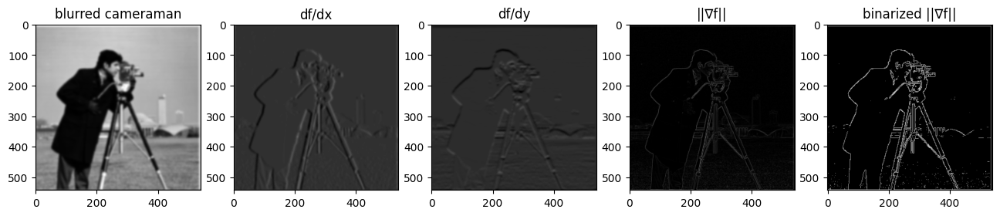

In [18]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(16,16))

cameraman_blurred = convolve(cameraman, gaussian_kernel())
ax1.imshow(cameraman_blurred, cmap='grey')
ax1.set_title('blurred cameraman')

cameraman_blurred_df_dx = convolve(cameraman_blurred, D_x)
ax2.imshow(cameraman_blurred_df_dx, cmap='gray')
ax2.set_title("df/dx")

cameraman_blurred_df_dy = convolve(cameraman_blurred, D_y)
ax3.imshow(cameraman_blurred_df_dy, cmap='gray')
ax3.set_title("df/dy")

cameraman_blurred_gradient = np.sqrt(dx ** 2 + dy ** 2)
ax4.imshow(cameraman_blurred_gradient, cmap='gray')
ax4.set_title("||∇f||")

cameraman_blurred_binarized = binarize(cameraman_blurred_gradient, cutoff=0.15)
ax5.imshow(cameraman_blurred_binarized, cmap='gray')
ax5.set_title("binarized ||∇f||")

plt.show()

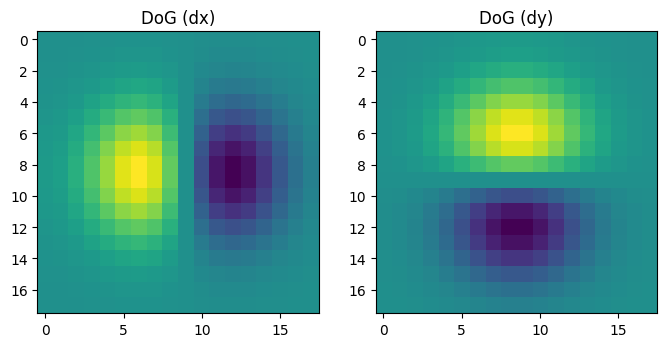

In [19]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 8))

D_x_DoG = convolve(gaussian_kernel(), D_x)
ax1.imshow(D_x_DoG)
ax1.set_title("DoG (dx)")

D_y_DoG = convolve(gaussian_kernel(), D_y)
ax2.imshow(D_y_DoG)
ax2.set_title("DoG (dy)")

plt.show()

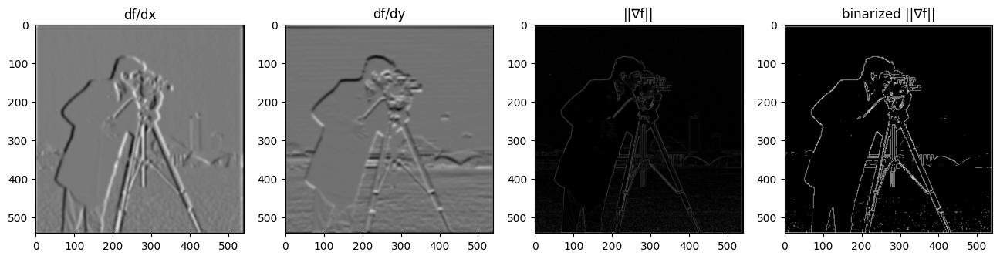

In [21]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 16))

cameraman_dog_df_dx = convolve(cameraman, D_x_DoG)
ax1.imshow(cameraman_dog_df_dx, cmap='gray')
ax1.set_title("df/dx")

cameraman_dog_dy_dx = convolve(cameraman, D_y_DoG)
ax2.imshow(cameraman_dog_dy_dx, cmap='gray')
ax2.set_title("df/dy")

cameraman_dog_gradient = np.sqrt(dx ** 2 + dy ** 2)
ax3.imshow(cameraman_dog_gradient, cmap='gray')
ax3.set_title("||∇f||")

cameraman_dog_binarized = binarize(cameraman_dog_gradient, cutoff=0.15)
ax4.imshow(cameraman_dog_binarized, cmap='gray')
ax4.set_title("binarized ||∇f||")

plt.show()

# Part 2: Fun with Frequencies!]

## Part 2.1: Image "Sharpening"

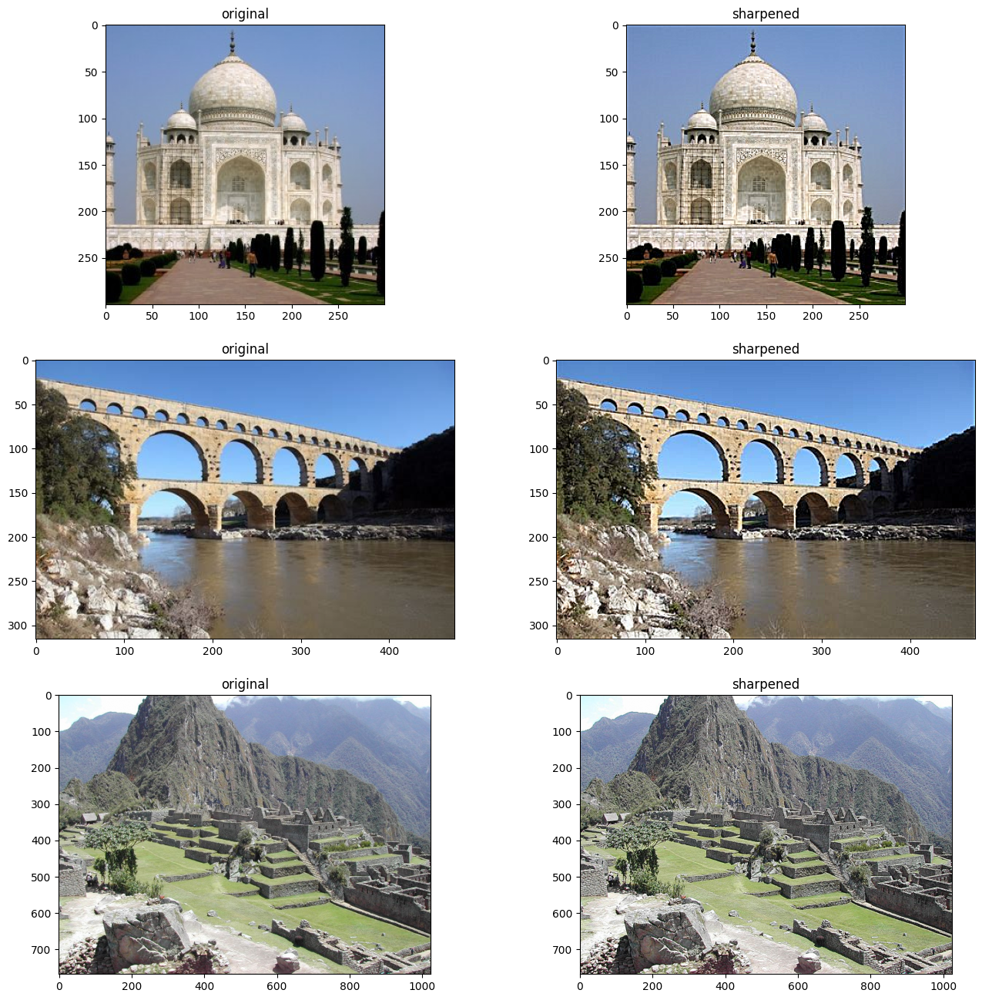

In [33]:
fig, rows = plt.subplots(3, 2, figsize=(16, 16))

for name, row in zip(['taj', 'aqueduct', 'machu_picchu'], rows):
    ax1, ax2 = row
    
    im = skio.imread(f'data/{name}.jpg')
    im = sk.img_as_float(im)
    
    ax1.imshow(im)
    ax1.set_title("original")

    sharpened = np.clip(convolve(im, unsharp_mask_filter()), min=0, max=1)
    ax2.imshow(sharpened)
    ax2.set_title("sharpened")

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5318368958943253..1.4535211775142336].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.771515546181304e-05..0.9529042692316816].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008187598917680273..0.9572296193757057].


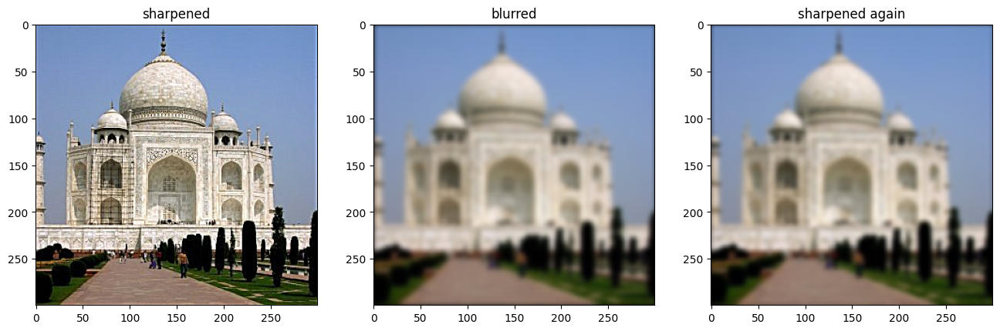

In [34]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 16))

im = skio.imread('data/taj.jpg')
im = sk.img_as_float(im)

im = convolve(im, unsharp_mask_filter())
ax1.imshow(im)
ax1.set_title("sharpened")

im = convolve(im, gaussian_kernel())
ax2.imshow(im)
ax2.set_title("blurred")

im = convolve(im, unsharp_mask_filter())
ax3.imshow(im)
ax3.set_title("sharpened again")

plt.show()

## Part 2.2: Hybrid Images

In [35]:
import sample.align_image_code as align

In [51]:
volcarona = sk.img_as_float(skio.imread('data/volcarona.jpg'))
frosmoth = sk.img_as_float(skio.imread('data/frosmoth.jpg'))

%matplotlib qt
frosmoth_aligned, volcarona_aligned = align.align_images(frosmoth, volcarona)
%matplotlib inline

Please select 2 points in each image for alignment.


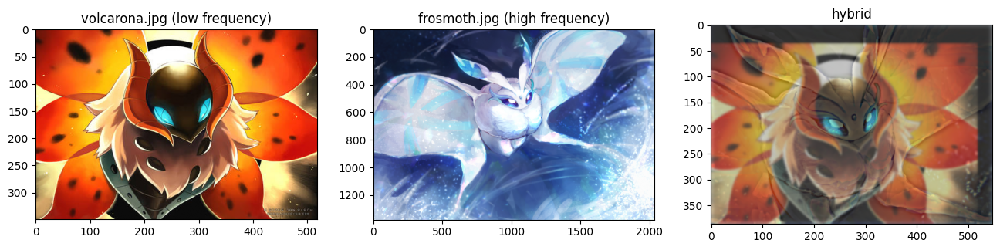

In [52]:
volcarona_frosmoth_hybrid = hybrid(volcarona_aligned, frosmoth_aligned, 2, 5, 0.5)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,16))

ax1.imshow(volcarona)
ax1.set_title('volcarona.jpg (low frequency)')

ax2.imshow(frosmoth)
ax2.set_title('frosmoth.jpg (high frequency)')

ax3.imshow(normalize(volcarona_frosmoth_hybrid))
ax3.set_title('hybrid')

plt.show()

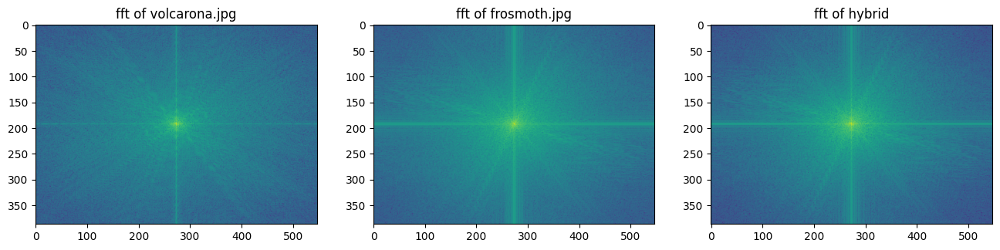

In [78]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,16))

ax1.imshow(fft(volcarona_aligned))
ax1.set_title('fft of volcarona.jpg')

ax2.imshow(fft(frosmoth_aligned))
ax2.set_title('fft of frosmoth.jpg')

ax3.imshow(fft(volcarona_frosmoth_hybrid))
ax3.set_title('fft of hybrid')

plt.show()

In [54]:
zuck = sk.img_as_float(skio.imread('data/zuck.jpg'))
cera = sk.img_as_float(skio.imread('data/cera.jpg'))

%matplotlib qt
zuck_aligned, cera_aligned = align.align_images(zuck, cera)
%matplotlib inline

Please select 2 points in each image for alignment.


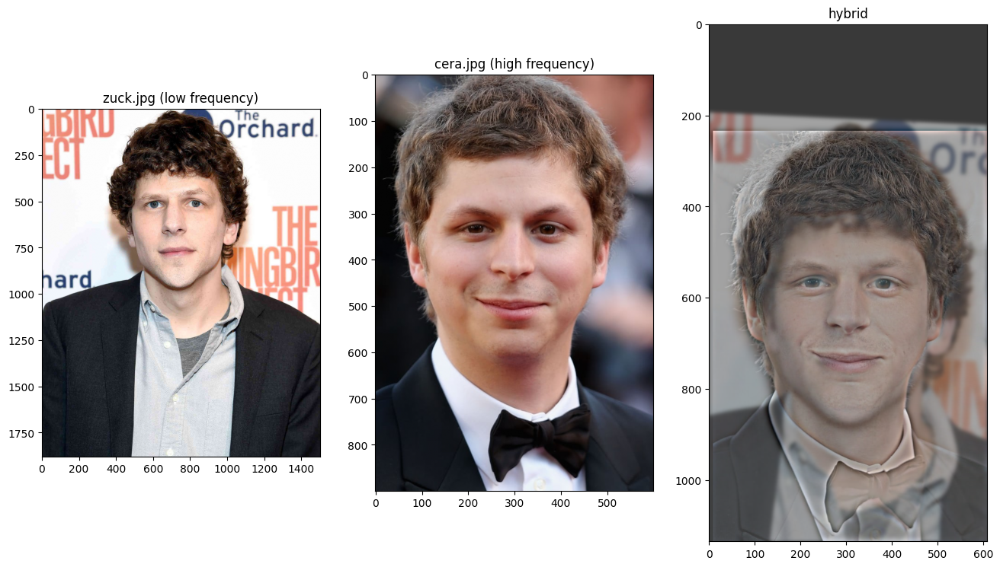

In [71]:
zuck_cera_hybrid = hybrid(zuck_aligned, cera_aligned, 4, 7, 0.65)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,16))

ax1.imshow(zuck)
ax1.set_title('zuck.jpg (low frequency)')

ax2.imshow(cera)
ax2.set_title('cera.jpg (high frequency)')

ax3.imshow(normalize(zuck_cera_hybrid))
ax3.set_title('hybrid')

plt.show()

In [60]:
aurelian = sk.img_as_float(skio.imread('data/aurelian.jpg'))
joebiden = sk.img_as_float(skio.imread('data/jover.jpg'))

%matplotlib qt
joebiden_aligned, aurelian_aligned = align.align_images(joebiden, aurelian)
%matplotlib inline

Please select 2 points in each image for alignment.


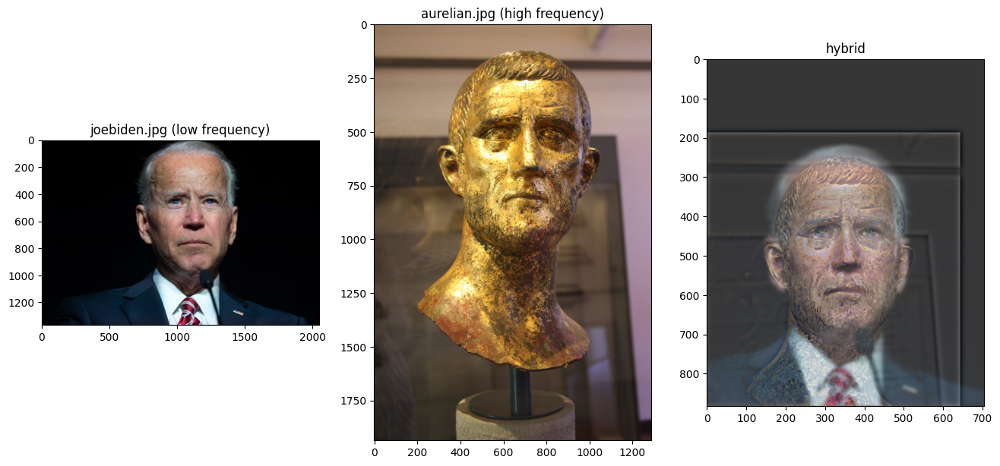

In [70]:
aurelian_biden_hybrid = hybrid(downscale(joebiden_aligned), downscale(aurelian_aligned), 4, 7, 0.5)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,16))

ax1.imshow(joebiden)
ax1.set_title('joebiden.jpg (low frequency)')

ax2.imshow(aurelian)
ax2.set_title('aurelian.jpg (high frequency)')

ax3.imshow(normalize(aurelian_biden_hybrid))
ax3.set_title('hybrid')

plt.show()

## Part 2.3: Gaussian and Laplacian Stacks

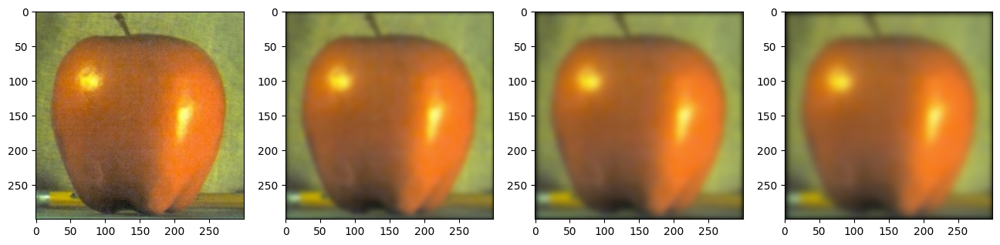

In [83]:
apple = sk.img_as_float(skio.imread('data/apple.jpeg'))
apple_stack = gaussian_stack(apple)

fig, axes = plt.subplots(1, 4, figsize=(16, 16))

for im, ax in zip(apple_stack, axes):
    ax.imshow(im)

plt.show()

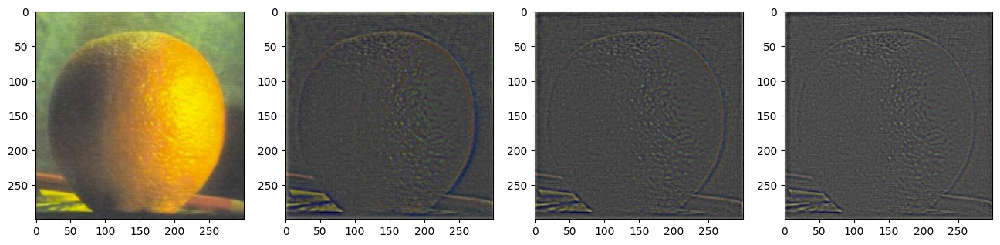

In [99]:
orange = sk.img_as_float(skio.imread('data/orange.jpeg'))
orange_stack = laplacian_stack(orange)

fig, axes = plt.subplots(1, 4, figsize=(16, 16))

for im, ax in zip(orange_stack, axes):
    ax.imshow(normalize(im))

plt.show()

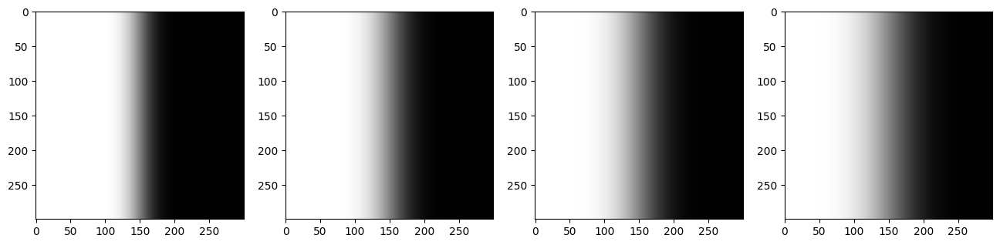

In [107]:
def _lr_masks_stack():
    left_mask = np.zeros((apple.shape[0], apple.shape[1]))
    center = left_mask.shape[0] // 2
    left_mask[:, :center] = 1
    return gaussian_stack(left_mask, n=5, std=20, boundary='symm')[1:]
lr_masks_stack = _lr_masks_stack()
fig, axes = plt.subplots(1, 4, figsize=(16, 16))
for im, ax in zip(lr_masks_stack, axes):
    ax.imshow(im, cmap='grey')

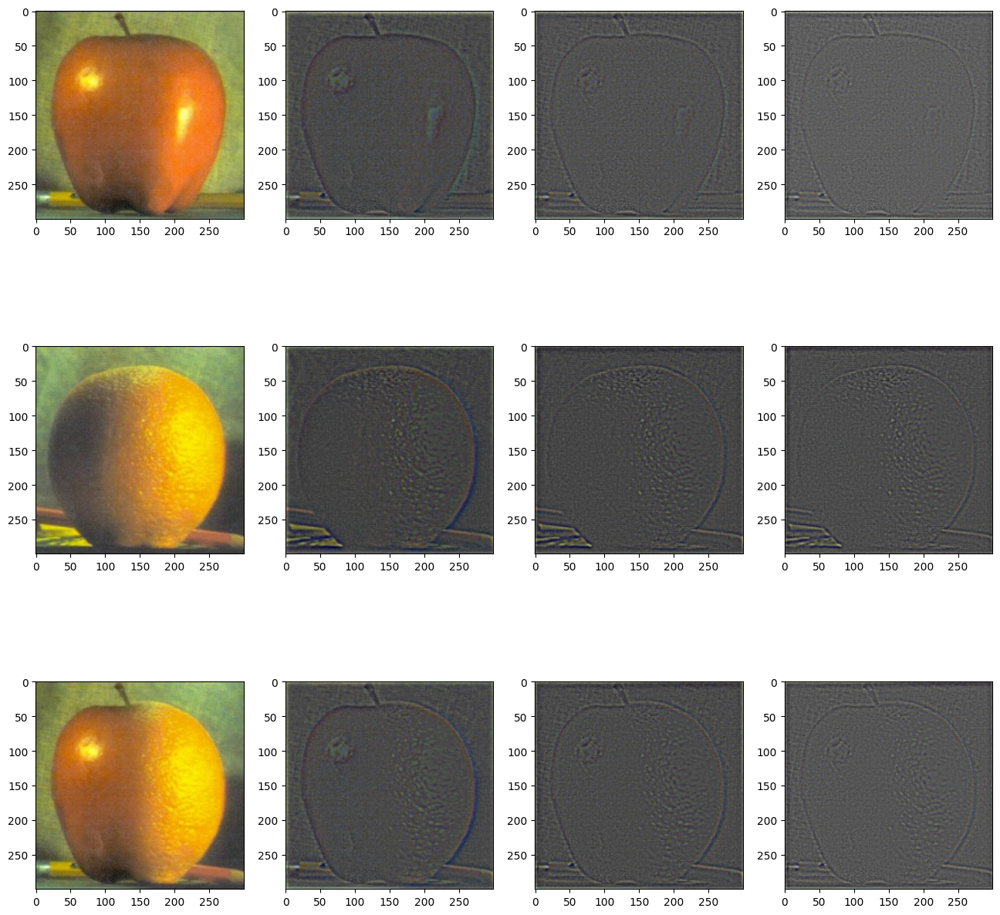

In [108]:
GR = [mask[:, :, np.newaxis] for mask in lr_masks_stack]
LA = laplacian_stack(apple)
LB = laplacian_stack(orange)
LS = [gr * la + (1 - gr) * lb for (gr, la, lb) in zip(GR, LA, LB)]
S = np.sum(LS, axis=0)

fig, rows = plt.subplots(3, 4, figsize=(16, 16))
for (row, stack) in zip(rows, [LA, LB, LS]):
    for (ax, im) in zip(row, stack):
        ax.imshow(normalize(im))

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.38781824889621397..2.0909281546813867].


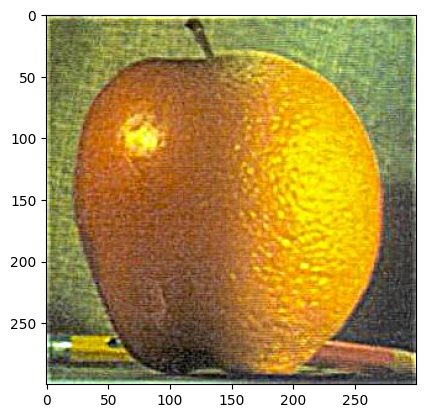

In [110]:
plt.imshow(S)
plt.show()

In [120]:
oski = sk.img_as_float(skio.imread('data/oski.jpg'))
bewear = sk.img_as_float(skio.imread('data/bewear.jpg'))

oski = downscale(oski, 0.75)
bewear = downscale(bewear, 0.25)

%matplotlib qt
bewear_aligned, oski_aligned = align.align_images(bewear, oski)
%matplotlib inline

Please select 2 points in each image for alignment.


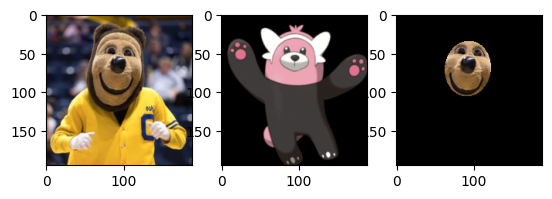

In [170]:
reload(utils)
from utils import *

bewear_best, oski_best = bewear_aligned[100:], oski_aligned[100:]
face_mask = oval_mask((95, 50), (90, 90), 36, oski_best.shape)

_, (ax1, ax2, ax3) = plt.subplots(1, 3)
ax1.imshow(oski_best)
ax2.imshow(bewear_best)
ax3.imshow(face_mask[:,:,np.newaxis] * oski_best)

plt.show()

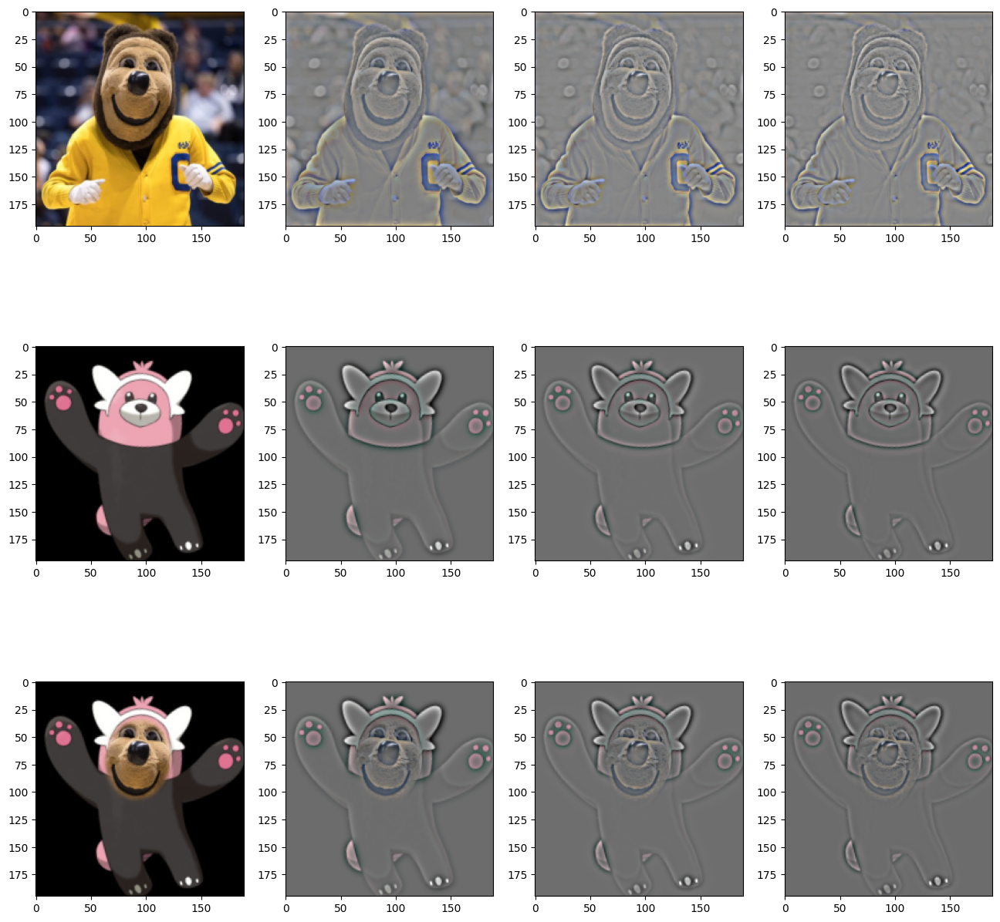

In [171]:
GR = [mask[:, :, np.newaxis] for mask in gaussian_stack(face_mask, n=5, std=2, boundary='symm')[1:]]
LA = laplacian_stack(oski_best)
LB = laplacian_stack(bewear_best)
LS = [gr * la + (1 - gr) * lb for (gr, la, lb) in zip(GR, LA, LB)]
S = np.sum(LS, axis=0)

fig, rows = plt.subplots(3, 4, figsize=(16, 16))
for (row, stack) in zip(rows, [LA, LB, LS]):
    for (ax, im) in zip(row, stack):
        ax.imshow(normalize(im))

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.4219686697194605..2.8931988426037374].


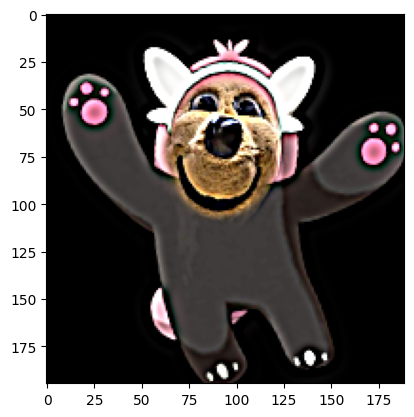

In [179]:
plt.imshow(S)
plt.show()

In [190]:
minas = sk.img_as_float(skio.imread('data/minas_tirith.jpg'))
kings = sk.img_as_float(skio.imread('data/kings_landing.jpg'))

minas = downscale(minas, 0.5)
kings = downscale(kings, 0.5)

%matplotlib qt
minas_aligned, kings_aligned = align.align_images(minas, kings)
%matplotlib inline

Please select 2 points in each image for alignment.


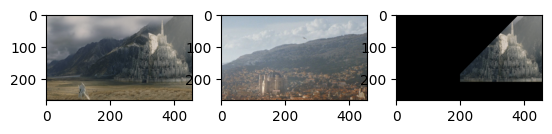

In [229]:
minas_best = minas_aligned[25:, 100:-50]
kings_best = kings_aligned[25:, 100:-50]
minas_mask = np.zeros((minas_best.shape[0], minas_best.shape[1]))
minas_mask[0:210, 200:500] = 1
for x in range(200, 401):
    y = -1 * (x - 400)
    minas_mask[0:y, x - 15] = 0 

fig, ax = plt.subplots(1, 3)
ax[0].imshow(minas_best)
ax[1].imshow(kings_best)
ax[2].imshow(minas_mask[:,:,np.newaxis] * minas_best)
plt.show()

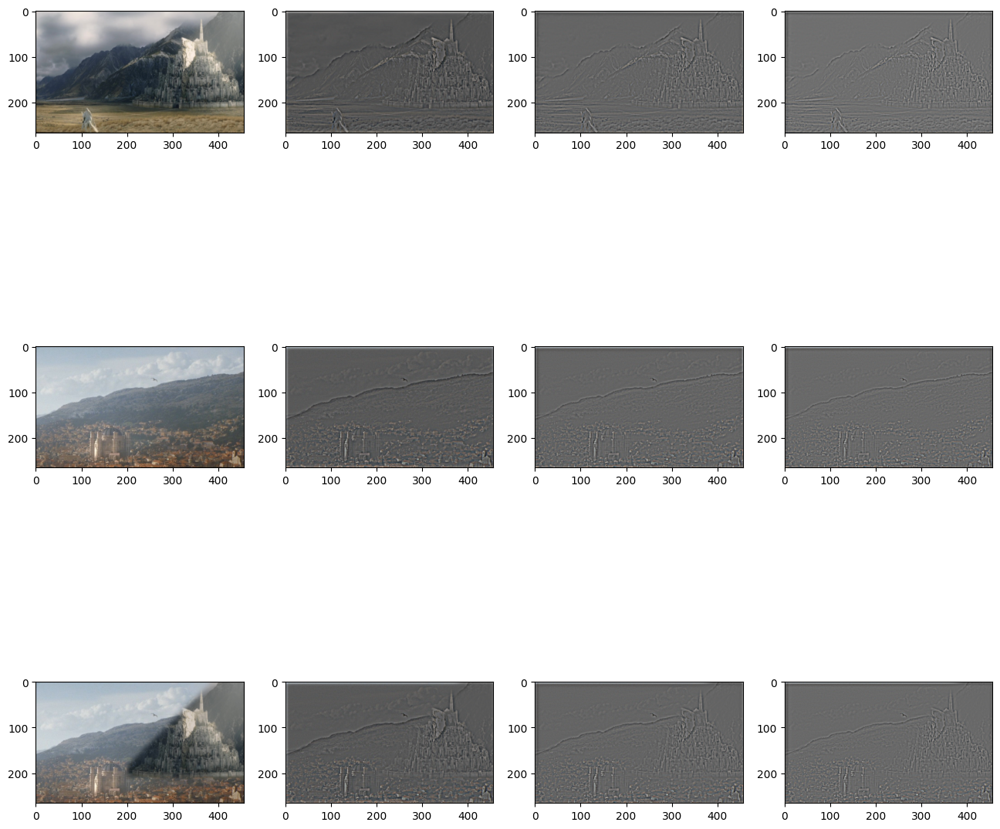

In [230]:
GR = [mask[:, :, np.newaxis] for mask in gaussian_stack(minas_mask, n=5, std=5, boundary='symm')[1:]]
LA = laplacian_stack(minas_best)
LB = laplacian_stack(kings_best)
LS = [gr * la + (1 - gr) * lb for (gr, la, lb) in zip(GR, LA, LB)]
S = np.sum(LS, axis=0)

fig, rows = plt.subplots(3, 4, figsize=(16, 16))
for (row, stack) in zip(rows, [LA, LB, LS]):
    for (ax, im) in zip(row, stack):
        ax.imshow(normalize(im))

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8827252008332104..2.1752010796395416].


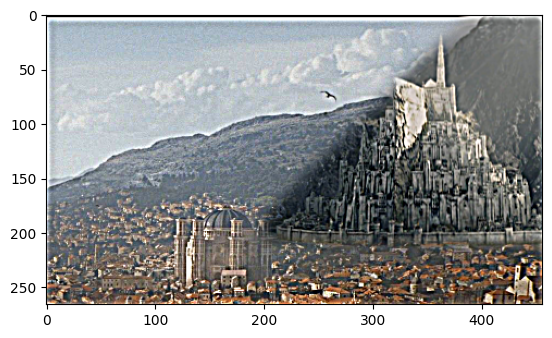

In [231]:
plt.imshow(S)
plt.show()